<a href="https://colab.research.google.com/github/emilsebover/Proyecto_Coder/blob/main/SEGUNDA_ENTREGA_BOVER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Abstract

En presente trabajo se analizaron los resultados productivos de una empresa productora de pollos parrilleros para detectar las variables que impactan sobre los resultados y realizar recomendaciones a partir de ello. En segunda instancia se construyó un modelo de predicción de resultados productivos en función de los datos que se suministren en el futuro. 

# Objetivo

El objetivo del presente trabajo es detectar el impacto de los factores que afectan al crecimiento de los pollos parrilleros para tomar decisiones que mejoren los resultados productivos. 

# Contexto comercial

El retorno económico de la empresa productora de pollos parrilleros depende de la obtención de mejores resultados productivos. A mayor ganancia de peso diaria, por ejemplo, el consumo total de alimento será menor disminuyendo el costo. Otro impacto positivo del aumento de la ganancia de peso diaria es que se reduce la edad a faena de los animales ya que se alcanza el peso deseado en menor cantidad de días. Esta reducción de días permite: liberación de superficie de producción (metros cuadrados de galpón, rotación), menor propensión a sufrir enfermedades y accidentes (por ejemplo cortes de luz). También el dueño de la granja tiene menores costos de luz y gas y por lo tanto mayores ganancias finales también.

# Contexto analítico

In [7]:
# Se presentan las librerías utilizadas:
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import numpy as np
import datetime

import statsmodels.api as sm
from scipy import stats
import requests
import json
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import preprocessing


In [78]:
!pip install nbconvert
! pip install -U scikit-learn
! pip install scikit-learn
! pip install pyppeteer
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 22.6 MB 22.4 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 89.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 15.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 68.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 11.2 MB

# Data acquisition

La empresa ha provisto un archivo excel con información de resultados y se utilizaron datos climáticos históricos obtenidos a través de una API de Open Meteo.

In [8]:
#Ingresos semanales compilado registra resultados finales de la producción en la pestaña BASE. Contiene además datos de genética, nutrición y sanidad.
df = pd.read_excel(r"/content/ingresos semanales compilado.xlsx",sheet_name='BASE', skiprows=1 , usecols=range(1,67))


In [9]:
# Se hizo una solicitud HTTP a la API de Open-Meteo
response = requests.get('https://archive-api.open-meteo.com/v1/archive?latitude=-32.48&longitude=-58.23&start_date=2020-01-01&end_date=2022-12-31&daily=temperature_2m_max,temperature_2m_min,precipitation_sum&timezone=America%2FSao_Paulo')

# Se convirtieron los datos JSON en un diccionario de Python
data = response.json()['daily']

# Se convirtió el diccionario en un DataFrame de pandas
dfc = pd.DataFrame(data)


# Data wrangling

Primero se eliminaron valores erróneos de la base de datos que se conocían antes de iniciar el análisis:

## Base de datos productivos

In [10]:
df.drop(df[(df['A.D.'] >100)].index, inplace=True) #Elimino valores erróneos
df.drop(df[(df['Edad'] >70)].index, inplace=True) #Elimino edades fuera de estándar

In [11]:
df.head()

,granja,Nombre,Primer BB,Cantid. BB,A Faena,% a 7 Días,% Mortan.,% Fal.,Kg. Pollo,P. Prom.,...,Índice,nd,zona climática,Cuartil EFS 2021,conv aj aviagen 2021,conv aj AVIAGEN,hepatitis,consumo total,"Pes conv 2,7",zona prod
0,357,MENESCARDI FABRICIO MEDARDO,2014-11-11,23200,20699,1.42,10.78,-1.09,58340,2.818494,...,1,NaN,Arrecifes,NaN,2.194775,2.191374,NaN,6.252186,1.239229,ER
1,605,COSSO CARLOS,2014-11-11,23176,20678,1.51,10.78,-1.88,61580,2.978044,...,2,NaN,otra ER,NaN,2.213669,2.205689,NaN,6.756601,1.240738,ER
2,833,CARDINAUX MARTIN ULISES,2014-11-14,40000,36825,1.45,7.94,-2.86,102480,2.782892,...,3,NaN,otra ER,NaN,2.006952,2.004573,NaN,5.630876,1.352869,ER
3,1710,STEGEMANN DANIELA CRISTINA,2014-11-11,29000,26423,1.10,8.89,0.25,74800,2.830867,...,4,NaN,otra ER,NaN,2.191255,2.187499,NaN,6.276615,1.242188,ER
4,2333,OJEDA LIVIO,2014-11-13,22000,19502,0.92,11.35,-1.91,53020,2.718696,...,5,NaN,otra ER,NaN,2.139559,2.139023,NaN,5.826890,1.263433,ER


In [12]:
columns_names = df.columns.values
columns_names
# Los resultados se agrupan por crianza (índice) de cada granja y se registran los diferentes resultados e indicadores de la producción#

array(['granja', 'Nombre', 'Primer BB', 'Cantid. BB', 'A Faena',
       '% a 7 Días', '% Mortan.', '% Fal.', 'Kg. Pollo', 'P. Prom.',
       'Kg. Alim.', 'Conv', 'Ulto. Levan.', 'Edad', 'A.D.', 'E.F.S.',
       'Gas', '$ x Ave Ter.', 'Gas x Ave In.', 'Bonificación',
       'Total Liqu.', 'Total Liq. con Bioseguridad',
       '$ AVE FINAL POR SISTEMA', 'año ingreso', 'mes ingreso',
       'semana ingreso', 'año levante', 'mes levante', 'semana levante',
       'sexo', 'zona', 'Tipo de granja', 'Estación del año',
       'Días de receso', 'Días de receso corregido',
       'Fuera de rango por receso', 'fuera de rango por mortandad',
       'mortandad semanal promedio', 'Conversión ajustada a 2,7 kg',
       'Consumo medio diario (g)', 'Consumo ajustado a 2,7 kg', 'Destino',
       'capacidad', 'Densidad', 'kg pollo/m2', 'aves/comedero',
       'Cuartil por crianza 2017', 'Ventilación forzada',
       'Ambiente controlado', 'Distancia a planta alimento', 'localidad',
       'experim', 'da

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15645 entries, 0 to 15647
Data columns (total 66 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   granja                        15645 non-null  int64         
 1   Nombre                        15645 non-null  object        
 2   Primer BB                     15645 non-null  datetime64[ns]
 3   Cantid. BB                    15645 non-null  int64         
 4   A Faena                       15645 non-null  int64         
 5   % a 7 Días                    15645 non-null  float64       
 6   % Mortan.                     15645 non-null  float64       
 7   % Fal.                        15645 non-null  float64       
 8   Kg. Pollo                     15645 non-null  int64         
 9   P. Prom.                      15645 non-null  float64       
 10  Kg. Alim.                     15645 non-null  int64         
 11  Conv                        

In [14]:
df.shape

(15645, 66)

La base de datos contiene resultados productivos de 15.571 crianzas desde el año 2015 hasta la primera quincena del mes de abril de 2023.

In [15]:
df.isna().sum()

granja                 0
Nombre                 0
Primer BB              0
Cantid. BB             0
A Faena                0
                   ...  
conv aj AVIAGEN        0
hepatitis          14848
consumo total          0
Pes conv 2,7           0
zona prod              0
Length: 66, dtype: int64

Los valores en blanco hallados pertenecen a una columna que no será utilizada en este análisis

In [16]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
15643    False
15644    False
15645    False
15646    False
15647    False
Length: 15645, dtype: bool

La base no posee valores de crianzas duplicados.

## Base de datos climáticos de Concepción del Uruguay, Entre Ríos

In [17]:
dfc.head()

,time,temperature_2m_max,temperature_2m_min,precipitation_sum
0,2020-01-01,26.1,20.8,0.0
1,2020-01-02,26.2,17.9,0.0
2,2020-01-03,26.8,18.7,0.0
3,2020-01-04,27.8,18.1,0.0
4,2020-01-05,30.3,19.6,0.0


In [18]:
columns_names = dfc.columns.values
columns_names

array(['time', 'temperature_2m_max', 'temperature_2m_min',
       'precipitation_sum'], dtype=object)

In [19]:
dfc.shape

(1096, 4)

In [20]:
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1096 entries, 0 to 1095
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   time                1096 non-null   object 
 1   temperature_2m_max  1096 non-null   float64
 2   temperature_2m_min  1096 non-null   float64
 3   precipitation_sum   1096 non-null   float64
dtypes: float64(3), object(1)
memory usage: 34.4+ KB


In [21]:
dfc.isna().sum()

time                  0
temperature_2m_max    0
temperature_2m_min    0
precipitation_sum     0
dtype: int64

La base no posee valores en blanco

In [22]:
dfc.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1091    False
1092    False
1093    False
1094    False
1095    False
Length: 1096, dtype: bool

La base no posee fechas duplicadas

## Transformaciones de las bases de datos para el análisis

De la base de datos provista por la empresa se seleccionarán las siguientes columnas para el análisis:

![image-2.png](attachment:image-2.png)


In [23]:
df=df[['granja','Primer BB','A Faena',
       '% Mortan.','P. Prom.',
       'Ulto. Levan.', 'Edad', 'A.D.',
     'año levante', 'mes levante',
       'Tipo de granja', 'Estación del año',
       'Consumo medio diario (g)', 'Destino',
     'Densidad', 'kg pollo/m2',
    'Ventilación forzada',
       'Ambiente controlado','localidad',
  '% desvío consumo std', 'Índice',
       'zona climática',
   'Pes conv 2,7',
       'zona prod']]

In [24]:
df.head()

,granja,Primer BB,A Faena,% Mortan.,P. Prom.,Ulto. Levan.,Edad,A.D.,año levante,mes levante,...,Densidad,kg pollo/m2,Ventilación forzada,Ambiente controlado,localidad,% desvío consumo std,Índice,zona climática,"Pes conv 2,7",zona prod
0,357,2014-11-11,20699,10.78,2.818494,2015-01-01,51.0,55.29,2015,1,...,11.047619,27.780952,N,N,Aldea Asunción,-8.231527,1,Arrecifes,1.239229,ER
1,605,2014-11-11,20678,10.78,2.978044,2015-01-01,51.0,58.43,2015,1,...,11.885128,31.579487,N,N,Gualeguay,-0.827811,2,otra ER,1.240738,ER
2,833,2014-11-14,36825,7.94,2.782892,2015-01-01,48.0,57.92,2015,1,...,10.000000,25.620000,N,N,Larroque,-7.796369,3,otra ER,1.352869,ER
3,1710,2014-11-11,26423,8.89,2.830867,2015-01-01,51.0,55.49,2015,1,...,11.600000,29.920000,N,N,Rocamora,-7.872962,4,otra ER,1.242188,ER
4,2333,2014-11-13,19502,11.35,2.718696,2015-01-01,49.0,55.51,2015,1,...,11.000000,26.510000,N,N,Villaguay,-8.107719,5,otra ER,1.263433,ER


In [25]:
df['Ulto. Levan.'] = pd.to_datetime(df['Ulto. Levan.']) #se define columna de fecha

In [26]:
dfc['time'] = pd.to_datetime(dfc['time']) #se define columna de fecha

In [27]:
#subset para año
df_1=df[['A.D.','año levante']] 
df_1.head()

,A.D.,año levante
0,55.29,2015
1,58.43,2015
2,57.92,2015
3,55.49,2015
4,55.51,2015


In [28]:
df_1['año levante'].astype('object')

0        2015
1        2015
2        2015
3        2015
4        2015
         ... 
15643    2023
15644    2023
15645    2023
15646    2023
15647    2023
Name: año levante, Length: 15645, dtype: object

In [29]:
df_1=df_1.groupby('año levante').mean().reset_index().round(2)
df_1

,año levante,A.D.
0,2015,55.65
1,2016,56.45
2,2017,58.12
3,2018,57.92
4,2019,56.99
5,2020,56.76
6,2021,58.44
7,2022,57.82
8,2023,55.26


In [30]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   año levante  9 non-null      int64  
 1   A.D.         9 non-null      float64
dtypes: float64(1), int64(1)
memory usage: 272.0 bytes


In [31]:
df_1.drop(df_1[(df_1['año levante'] ==2023)].index, inplace=True) 

In [32]:
#subset para estación del año
df_2=df[['A.D.','Estación del año']]
df_2.head()

,A.D.,Estación del año
0,55.29,verano
1,58.43,verano
2,57.92,verano
3,55.49,verano
4,55.51,verano


In [33]:
df_2=df_2.groupby('Estación del año').mean().reset_index().round(2)
df_2

,Estación del año,A.D.
0,invierno,57.99
1,otoño,55.91
2,primavera,59.94
3,verano,55.14


In [34]:
#subset para mes del año
df_3=df[['A.D.','mes levante']]
df_3.head()

,A.D.,mes levante
0,55.29,1
1,58.43,1
2,57.92,1
3,55.49,1
4,55.51,1


In [35]:
df_3=df_3.groupby('mes levante').mean().reset_index().round(2)
df_3

,mes levante,A.D.
0,1,55.41
1,2,54.79
2,3,54.84
3,4,55.49
4,5,55.99
5,6,56.43
6,7,57.09
7,8,58.67
8,9,59.53
9,10,60.37


In [36]:
#subset para sistema de ventilación
dfv=df[['Índice','granja','Ulto. Levan.','A Faena','% desvío consumo std','% Mortan.','P. Prom.','Edad','kg pollo/m2','Estación del año','Ventilación forzada','Ambiente controlado','A.D.','Pes conv 2,7','zona prod','mes levante','año levante']]
dfv.head()

,Índice,granja,Ulto. Levan.,A Faena,% desvío consumo std,% Mortan.,P. Prom.,Edad,kg pollo/m2,Estación del año,Ventilación forzada,Ambiente controlado,A.D.,"Pes conv 2,7",zona prod,mes levante,año levante
0,1,357,2015-01-01,20699,-8.231527,10.78,2.818494,51.0,27.780952,verano,N,N,55.29,1.239229,ER,1,2015
1,2,605,2015-01-01,20678,-0.827811,10.78,2.978044,51.0,31.579487,verano,N,N,58.43,1.240738,ER,1,2015
2,3,833,2015-01-01,36825,-7.796369,7.94,2.782892,48.0,25.620000,verano,N,N,57.92,1.352869,ER,1,2015
3,4,1710,2015-01-01,26423,-7.872962,8.89,2.830867,51.0,29.920000,verano,N,N,55.49,1.242188,ER,1,2015
4,5,2333,2015-01-01,19502,-8.107719,11.35,2.718696,49.0,26.510000,verano,N,N,55.51,1.263433,ER,1,2015


In [37]:
dfv.set_index('Índice')


,granja,Ulto. Levan.,A Faena,% desvío consumo std,% Mortan.,P. Prom.,Edad,kg pollo/m2,Estación del año,Ventilación forzada,Ambiente controlado,A.D.,"Pes conv 2,7",zona prod,mes levante,año levante
Índice,,,,,,,,,,,,,,,,
1,357,2015-01-01,20699,-8.231527,10.78,2.818494,51.0,27.780952,verano,N,N,55.29,1.239229,ER,1,2015
2,605,2015-01-01,20678,-0.827811,10.78,2.978044,51.0,31.579487,verano,N,N,58.43,1.240738,ER,1,2015
3,833,2015-01-01,36825,-7.796369,7.94,2.782892,48.0,25.620000,verano,N,N,57.92,1.352869,ER,1,2015
4,1710,2015-01-01,26423,-7.872962,8.89,2.830867,51.0,29.920000,verano,N,N,55.49,1.242188,ER,1,2015
5,2333,2015-01-01,19502,-8.107719,11.35,2.718696,49.0,26.510000,verano,N,N,55.51,1.263433,ER,1,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15579,134,2023-04-27,50104,3.113529,7.21,3.060000,46.7,34.026667,otoño,S,N,65.57,1.475410,ER,4,2023
15601,1650,2023-04-27,154616,-15.774491,11.65,2.510000,49.0,46.235714,otoño,S,S,51.26,1.242331,ER,4,2023
15619,2062,2023-04-27,83391,-6.343621,9.85,2.590000,45.7,28.084416,otoño,S,N,56.70,1.319218,CR,4,2023


In [38]:
# Datos para gráfico 5
serie1 =  dfv.loc[dfv['Ventilación forzada'] == 'N' ,'A.D.']
serie2 =  dfv.loc[dfv['Ventilación forzada'] == 'S' ,'A.D.']
serie3 =  dfv.loc[dfv['Ventilación forzada'] == 'MI' ,'A.D.']

In [39]:
#subset para sistema de ventilación 2
dfv_a= dfv.groupby('Ventilación forzada')['A.D.'].mean().reset_index()
dfv_a.set_index('Ventilación forzada')
dfv_a

,Ventilación forzada,A.D.
0,MI,58.856173
1,N,56.731011
2,S,60.131978


In [40]:
#Nuevo dataframe con los datos filtrados para la localidad de Concepción del Uruguay y fechas para los que se tienen valores de temperaturas
dfCDU_2=df[['Índice','granja','Ulto. Levan.','A Faena','% desvío consumo std','% Mortan.','P. Prom.','Edad','kg pollo/m2','Estación del año','Ventilación forzada','Ambiente controlado','A.D.','Pes conv 2,7','zona prod','mes levante','año levante','zona climática']]

In [41]:
dfCDU_3=dfCDU_2[(dfCDU_2['Ulto. Levan.']>'2019-12-31' ) & (dfCDU_2['Ulto. Levan.']<'2023-04-01')]


In [42]:
#Se unifican los dos dataframes generados: datos climáticos y datos productivos de la zona de Concepción del Uruguay en Entre Ríos
df_U=pd.merge(dfc, dfCDU_3, left_on='time', right_on='Ulto. Levan.')
df_U.head()

,time,temperature_2m_max,temperature_2m_min,precipitation_sum,Índice,granja,Ulto. Levan.,A Faena,% desvío consumo std,% Mortan.,...,kg pollo/m2,Estación del año,Ventilación forzada,Ambiente controlado,A.D.,"Pes conv 2,7",zona prod,mes levante,año levante,zona climática
0,2020-01-01,26.1,20.8,0.0,9244,107,2020-01-01,23255,-3.957466,6.23,...,22.817778,verano,N,N,55.25,1.321370,ER,1,2020,otra ER
1,2020-01-01,26.1,20.8,0.0,9245,351,2020-01-01,10368,-7.039973,9.84,...,20.086957,verano,N,N,51.03,1.170520,ER,1,2020,otra ER
2,2020-01-01,26.1,20.8,0.0,9246,405,2020-01-01,10549,34.718920,37.95,...,17.886364,verano,N,N,58.43,0.904018,ER,1,2020,otra ER
3,2020-01-01,26.1,20.8,0.0,9247,1409,2020-01-01,12096,-11.679734,10.40,...,21.913043,verano,N,N,50.11,1.200000,ER,1,2020,otra ER
4,2020-01-01,26.1,20.8,0.0,9248,1837,2020-01-01,44696,-7.923694,5.90,...,32.346325,verano,N,N,57.71,1.345515,ER,1,2020,C. del Uruguay


In [43]:
#subset para análisis nuevo dataframe
df_U2=df_U[['año levante','mes levante','temperature_2m_max','A.D.','Ventilación forzada']]
df_U2.head()

,año levante,mes levante,temperature_2m_max,A.D.,Ventilación forzada
0,2020,1,26.1,55.25,N
1,2020,1,26.1,51.03,N
2,2020,1,26.1,58.43,N
3,2020,1,26.1,50.11,N
4,2020,1,26.1,57.71,N


In [44]:
df_U2=df_U2.groupby(['año levante','mes levante','Ventilación forzada']).mean().reset_index()
df_U2.head()

,año levante,mes levante,Ventilación forzada,temperature_2m_max,A.D.
0,2020,1,MI,28.471429,59.065714
1,2020,1,N,28.930573,56.057452
2,2020,1,S,28.877273,60.679545
3,2020,2,MI,30.137500,56.728750
4,2020,2,N,28.905600,54.731760


In [45]:
df_U3=df_U[['año levante','mes levante','temperature_2m_min','A.D.','Ventilación forzada']]
df_U3.head()

,año levante,mes levante,temperature_2m_min,A.D.,Ventilación forzada
0,2020,1,20.8,55.25,N
1,2020,1,20.8,51.03,N
2,2020,1,20.8,58.43,N
3,2020,1,20.8,50.11,N
4,2020,1,20.8,57.71,N


In [46]:
df_U3=df_U3.groupby(['año levante','mes levante','Ventilación forzada']).mean().reset_index()
df_U3.head()

,año levante,mes levante,Ventilación forzada,temperature_2m_min,A.D.
0,2020,1,MI,19.828571,59.065714
1,2020,1,N,19.871975,56.057452
2,2020,1,S,19.818182,60.679545
3,2020,2,MI,20.687500,56.728750
4,2020,2,N,18.788000,54.731760


In [47]:
df_4=df[['A.D.','zona prod']]
df_4.head()

,A.D.,zona prod
0,55.29,ER
1,58.43,ER
2,57.92,ER
3,55.49,ER
4,55.51,ER


In [48]:
df_4=df_4.groupby(['zona prod']).mean().reset_index().round(2)

df_4

,zona prod,A.D.
0,BA,58.64
1,CR,60.35
2,ER,56.43


In [49]:
df2_num = df.select_dtypes(exclude=object)
df2_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15645 entries, 0 to 15647
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   granja                    15645 non-null  int64         
 1   Primer BB                 15645 non-null  datetime64[ns]
 2   A Faena                   15645 non-null  int64         
 3   % Mortan.                 15645 non-null  float64       
 4   P. Prom.                  15645 non-null  float64       
 5   Ulto. Levan.              15645 non-null  datetime64[ns]
 6   Edad                      15645 non-null  float64       
 7   A.D.                      15645 non-null  float64       
 8   año levante               15645 non-null  int64         
 9   mes levante               15645 non-null  int64         
 10  Consumo medio diario (g)  15645 non-null  float64       
 11  Densidad                  15645 non-null  float64       
 12  kg pollo/m2       

In [50]:
df2_object= df.select_dtypes(include=object)
df2_object.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15645 entries, 0 to 15647
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Tipo de granja       15645 non-null  object
 1   Estación del año     15645 non-null  object
 2   Destino              15645 non-null  object
 3   Ventilación forzada  15645 non-null  object
 4   Ambiente controlado  15645 non-null  object
 5   localidad            15645 non-null  object
 6   zona climática       15645 non-null  object
 7   zona prod            15645 non-null  object
dtypes: object(8)
memory usage: 1.1+ MB


In [51]:
#subset para machine learning
df_5= df[['A.D.', 'año levante','mes levante','Estación del año', 'Ventilación forzada','zona prod']]
df_5.head()

,A.D.,año levante,mes levante,Estación del año,Ventilación forzada,zona prod
0,55.29,2015,1,verano,N,ER
1,58.43,2015,1,verano,N,ER
2,57.92,2015,1,verano,N,ER
3,55.49,2015,1,verano,N,ER
4,55.51,2015,1,verano,N,ER


In [52]:
label_encoder = preprocessing.LabelEncoder()
df_5['Estación del año']= label_encoder.fit_transform(df_5['Estación del año'])
df_5['Estación del año'].unique()

<ipython-input-52-54173e9cc693>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_5['Estación del año']= label_encoder.fit_transform(df_5['Estación del año'])


array([3, 1, 0, 2])

In [53]:
label_encoder = preprocessing.LabelEncoder()
df_5['Ventilación forzada']= label_encoder.fit_transform(df_5['Ventilación forzada'])
df_5['Ventilación forzada'].unique()

<ipython-input-53-8481bd4d64aa>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_5['Ventilación forzada']= label_encoder.fit_transform(df_5['Ventilación forzada'])


array([1, 2, 0])

In [54]:
label_encoder = preprocessing.LabelEncoder()
df_5['zona prod']= label_encoder.fit_transform(df_5['zona prod'])
df_5['zona prod'].unique()

<ipython-input-54-0eefc011672f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_5['zona prod']= label_encoder.fit_transform(df_5['zona prod'])


array([2, 0, 1])

In [55]:
df_5.head()

,A.D.,año levante,mes levante,Estación del año,Ventilación forzada,zona prod
0,55.29,2015,1,3,1,2
1,58.43,2015,1,3,1,2
2,57.92,2015,1,3,1,2
3,55.49,2015,1,3,1,2
4,55.51,2015,1,3,1,2


In [56]:
df_5.corr().round(2)

,A.D.,año levante,mes levante,Estación del año,Ventilación forzada,zona prod
A.D.,1.00,0.06,0.32,-0.10,0.14,-0.18
año levante,0.06,1.00,-0.07,0.04,0.02,-0.07
mes levante,0.32,-0.07,1.00,-0.30,-0.00,-0.00
Estación del año,-0.10,0.04,-0.30,1.00,0.00,-0.01
Ventilación forzada,0.14,0.02,-0.00,0.00,1.00,-0.04
zona prod,-0.18,-0.07,-0.00,-0.01,-0.04,1.00


# Análisis exploratorio de datos

In [79]:
#Data Profiling
import pandas_profiling
profile = pandas_profiling.ProfileReport(df)
profile

<ipython-input-79-4d6ad4e598b6>:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: title={'center': 'Ganancia diaria de peso'}, xlabel='A.D.', ylabel='Count'>

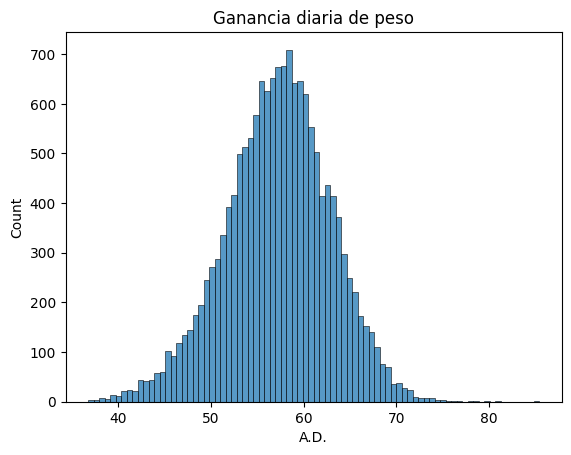

In [58]:
#Gráfico 1
#Histograma de Ganancia media diaria de peso de las 15.571 crianzas de la base#
ax=sns.histplot(data=df, x='A.D.')
ax.set(title='Ganancia diaria de peso')
ax

In [59]:
df['A.D.'].describe().round(2)

count    15645.00
mean        57.18
std          5.70
min         36.76
25%         53.55
50%         57.39
75%         61.00
max         85.43
Name: A.D., dtype: float64

La **ganancia media diaria de peso** es una medida que permite comparar resultados entre granjas y además permite ver la evolución de los resultados globales de la empresa a lo largo del tiempo. A mayor valor, mejor será el resultado. El valor medio es de **57.18** gramos de peso ganados promedio por día.

[Text(0.5, 1.0, 'Ganancia diaria de peso por año')]

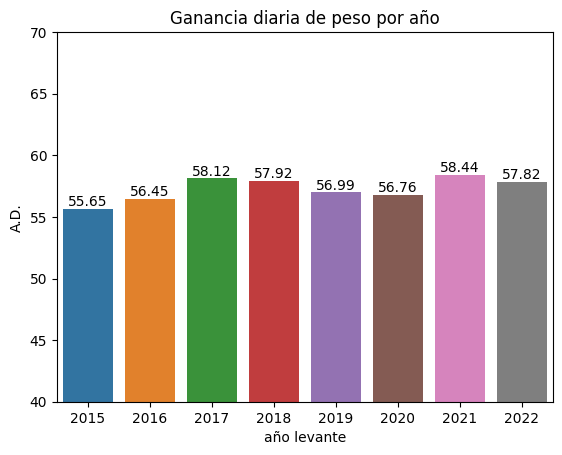

In [60]:
# Gráfico 2
ax=sns.barplot(data=df_1, x='año levante',y='A.D.') 
ax.bar_label(ax.containers[0])
ax.set(ylim=(40, 70))
ax.set(title='Ganancia diaria de peso por año')

Se observa que las ganancias de peso de los años 2017 y 2021 fueron superiores al resto de los años analizados. El año 2023 fue excluído por estar incompleto.

[Text(0.5, 1.0, 'Ganancia diaria de peso por estación del año')]

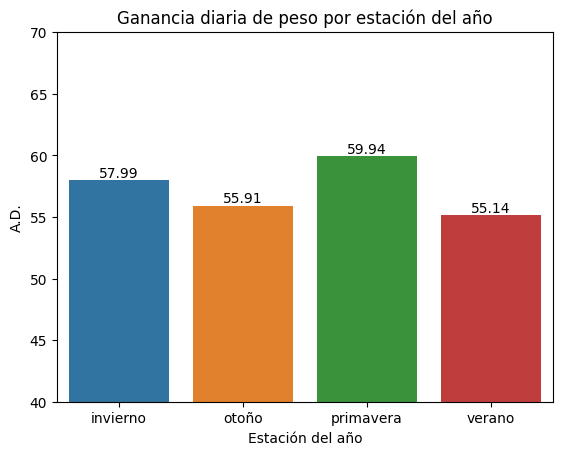

In [61]:
# Gráfico 3
ax=sns.barplot(data=df_2, x='Estación del año',y='A.D.') 
ax.bar_label(ax.containers[0])
ax.set(ylim=(40, 70))
ax.set(title='Ganancia diaria de peso por estación del año')

Se observa que la ganancia de peso es variable según la estación del año en la que se desarrolle la crianza, las mayores ganancias de peso ocurren en primavera y las peores en verano dando indicios de que el ambiente puede estar afectando el resultado productivo.

[Text(0.5, 1.0, 'Ganancia diaria de peso por mes del año')]

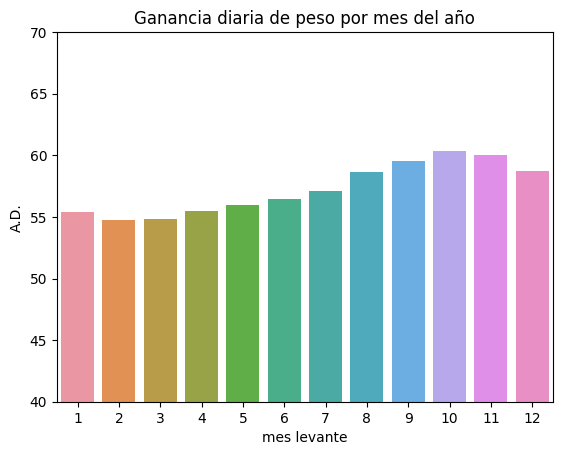

In [62]:
# Gráfico 4
ax=sns.barplot(data=df_3, x='mes levante',y='A.D.') 
ax.set(ylim=(40, 70))
ax.set(title='Ganancia diaria de peso por mes del año')

Se observan también diferencias en los valores de ganancia media diaria de peso en los meses del año. Debido a ello a continuación se realizará un análisis según los tipos de ventilación que poseen las granjas.

Para ello se han clasificado las granjas en tres categorías:

S: Ventilación forzada: La ventilación del galpón se realiza a través de la entrada del aire por inlets o aberturas en la zona superior de los galpones y su posterior expulsión por extractores.

N: Granjas con sistema de ventilación convencional con encendido manual de ventiladores y/o apertura y cierre de las cortinas laterales del galpón.

MI: Mixtas: Granjas que tienen ambos tipos de galpones.

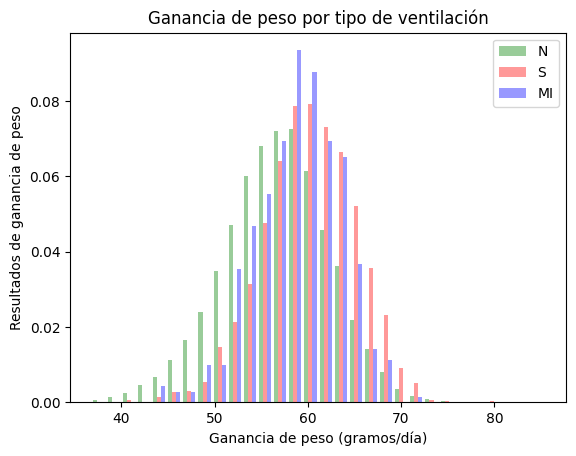

In [63]:
# Gráfico 5
plt.hist([serie1, serie2, serie3], bins=30, density= True, color=['green', 'red','blue'], alpha=0.4)
plt.title('Ganancia de peso por tipo de ventilación')
plt.xlabel('Ganancia de peso (gramos/día)')
plt.ylabel('Resultados de ganancia de peso')
plt.legend(['N', 'S','MI'])


En el gráfico se observa que los valores de ganancia de peso de los tres sistemas tienen una distribución normal y que el sistema convencional logra menores ganancias de peso que los sistemas de ventilación forzada y mixto.La distribución de los datos de las granjas convencionales se encuentra desplazada hacia la izquierda, es decir hacia valores menores de ganancia. Su promedio se ubica alrededor de los 56 gramos/días mientras que el promedio de las granjas de ventilación forzada está alrededor de los 60 gramos/día.

[Text(0.5, 1.0, 'Ganancia diaria de peso por sistema de ventilación')]

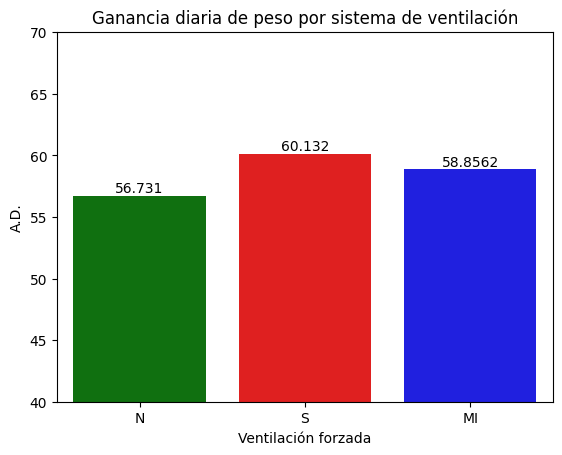

In [64]:
# Gráfico 6
ax=sns.barplot(data=dfv_a, x='Ventilación forzada',y='A.D.', order=['N','S','MI'], palette=['green', 'red','blue']) 
ax.bar_label(ax.containers[0])
ax.set(ylim=(40, 70))
ax.set(title='Ganancia diaria de peso por sistema de ventilación')

Habría indicios de que el sistema de ventilación tiene impacto sobre la ganancia de peso de los animales.

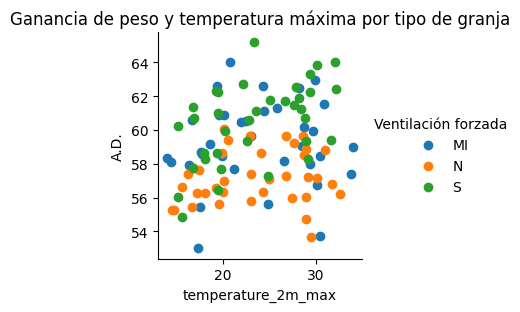

In [65]:
# Gráfico 7
ax=sns.FacetGrid(df_U2,hue='Ventilación forzada').map(plt.scatter,'temperature_2m_max','A.D.').add_legend()

ax.set(title='Ganancia de peso y temperatura máxima por tipo de granja')

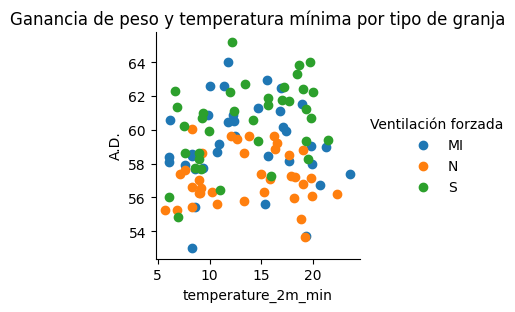

In [66]:
# Gráfico 8
ax=sns.FacetGrid(df_U3,hue='Ventilación forzada').map(plt.scatter,'temperature_2m_min','A.D.').add_legend()
ax.set(title='Ganancia de peso y temperatura mínima por tipo de granja')

Los gráficos de correlación entre la ganancia de peso y las temperaturas máximas y mínimas diarias no muestran ninguna relación entre estas variables y tampoco en relación al sistema de ventilación.

[Text(0.5, 1.0, 'Ganancia diaria de peso por zona de producción')]

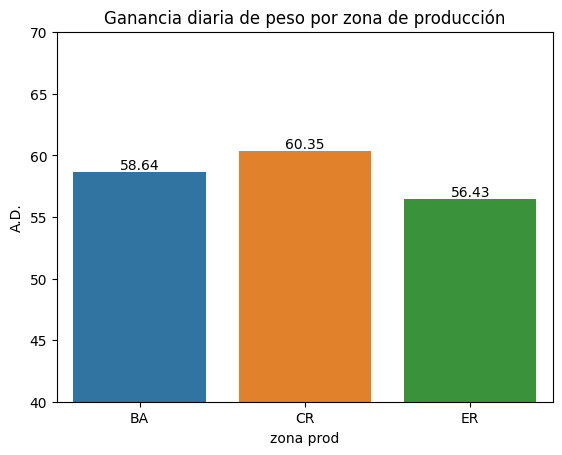

In [67]:
# Gráfico 9
ax=sns.barplot(data=df_4, x='zona prod',y='A.D.') 
ax.bar_label(ax.containers[0])
ax.set(ylim=(40, 70))
ax.set(title='Ganancia diaria de peso por zona de producción')

A nivel de promedios, hay diferencias entre las zonas del país donde se encuentran ubicadas las granjas.

[Text(0.5, 1.0, 'Ganancia diaria de peso por zona de producción')]

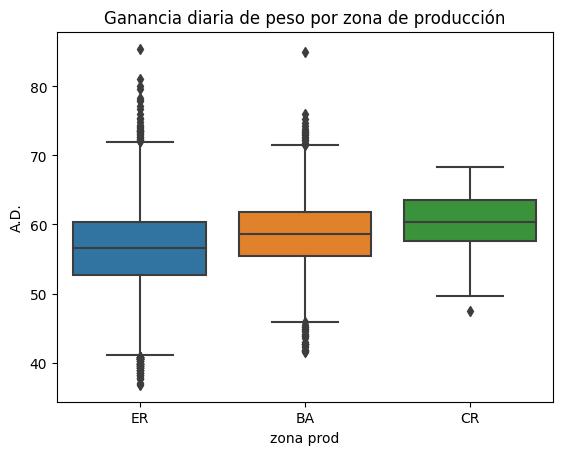

In [68]:
# Gráfico 10
ax=sns.boxplot(data=df, x='zona prod', y='A.D.') 
ax.set(title='Ganancia diaria de peso por zona de producción')

Los mejores resultados se encuentran en la zona de Crespo (CR), no solo porque tiene mayores valores de ganancia de peso sino también porque los resultados tienen menor dispersión y prácticamente no posee resultados atípicos.

## Correlaciones

Text(0.5, 1.0, 'Mapa de calor de los coeficientes de correlación')

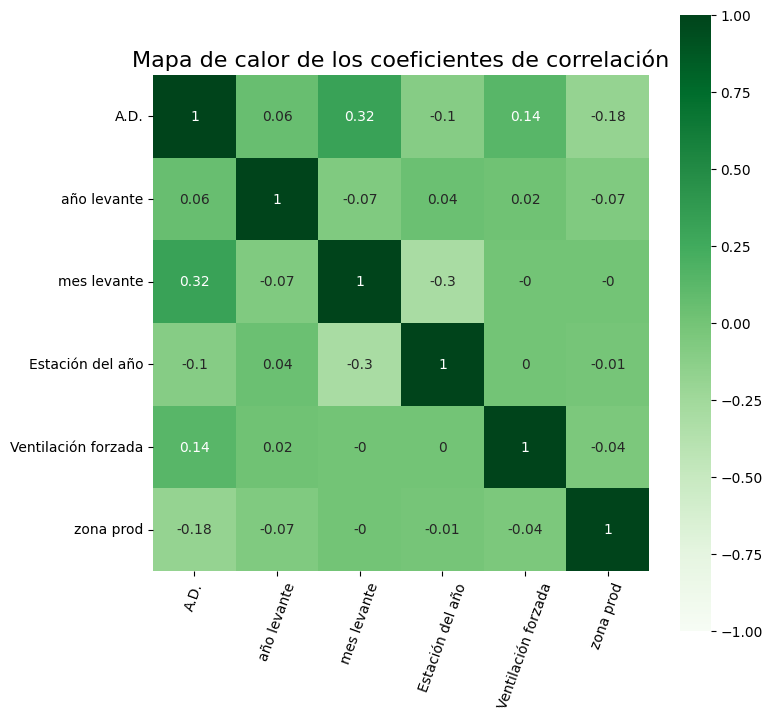

In [69]:
# Gráfico 11
plt.figure(figsize = (8,8))
plt.axis('scaled')
sns.heatmap(df_5.corr().round(2), vmin=-1, vmax=1, cmap = "Greens", cbar = True, annot=True)
plt.xticks(rotation = 70)
plt.title('Mapa de calor de los coeficientes de correlación', fontsize = 16)


Del análisis del mapa de calor se desprende que la correlación entre la ganancia diaria de peso y las variables analizadas es baja en general, siendo los mayores valores un 32% para el mes de levante, un 27% de correlación positiva para la estación del año primavera y un 22% de correlación negativa para la estación verano. 

# Machine learning aproximación

In [70]:
# Seleccionar las variables predictoras y la variable de destino
X = df_5.drop('A.D.', 1) 
y = df_5['A.D.']

<ipython-input-70-bcdc841d7e6c>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X = df_5.drop('A.D.', 1)


In [71]:
# Dividir el conjunto de datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Modelo SVR

In [72]:
# Crear el modelo de SVR
model = SVR(kernel='rbf', C=1e3, gamma=0.1)

In [73]:
model.fit(X_train, y_train)

SVR(C=1000.0, gamma=0.1)

In [74]:
# Hacer predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

In [75]:
# Calcular el error cuadrático medio (MSE) y el coeficiente de determinación (R²)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [76]:
# Mostrar las métricas de evaluación de rendimiento
print("Error cuadrático medio (MSE):", mse)
print("Coeficiente de determinación (R²):", r2)

Error cuadrático medio (MSE): 24.685740309200384
Coeficiente de determinación (R²): 0.23898212288917642


El modelo aplicado tiene un error cuadrático medio de 24.7 con un coeficiente de determinación del 23.9% 

In [77]:
np.sqrt(mse) #raíz cuadrada del error

4.968474646126353

La diferencia entre los valores predichos y los valores reales del modelo es aceptable mientras que la calidad del ajuste del modelo a los datos es baja.